<a href="https://colab.research.google.com/github/ckurtz/teaching_UPC_UFRMI/blob/main/CLIP_tutorial_(with_medical_images_ROCO).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

# [Consigne] 1.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.2 MB/s eta 0:00:00
  Attempting uninstall: wcwidth
    Found existing installation: wcwidth 0.2.10
    Uninstalling wcwidth-0.2.10:
      Successfully uninstalled wcwidth-0.2.10


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-gagqtihw
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-gagqtihw
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369500 sha256=6157d2864dca3078eafe566c27b7eabe09f7abcc2e703e8f051f1c81d0176079
  Stored in directory: /tmp/pip-ephem-wheel-cache-9vk6w_c1/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


## Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [2]:
import clip
import numpy as np

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [ ]:
model, preprocess = clip.load("ViT-B/16")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 335M/335M [00:04<00:00, 79.9MiB/s]


Model parameters: 149,620,737
Input resolution: 224
Context length: 77
Vocab size: 49408


## Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [ ]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7db14790d870>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

## Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [ ]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

## Setting up input images and texts

We are going to feed 8 example natrural/medical images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [3]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
# !mkdir -p drive
# !google-drive-ocamlfuse drive
print(base_working_dir)

Mounted at /content/drive
/content/drive/MyDrive


In [ ]:
# images to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

med_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney"
}

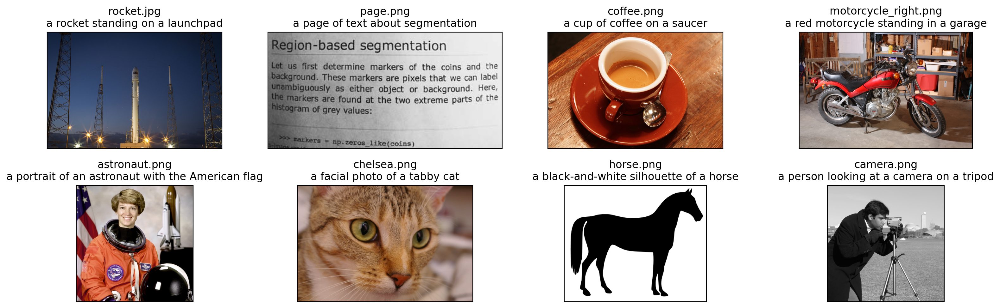

In [ ]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


### Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [ ]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

In [ ]:
# check embedding dimensions
print(image_features[0].shape, text_features[0].shape)

torch.Size([512]) torch.Size([512])


### Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [ ]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

In [ ]:
for s in similarity:
    print(s)

[0.28106388 0.13892242 0.14233449 0.13580137 0.20187345 0.16354778
 0.16240443 0.21226153]
[0.15363462 0.3515069  0.18079385 0.13132009 0.1598222  0.21461691
 0.2250649  0.18166609]
[0.10832168 0.14898437 0.29385975 0.11491076 0.13832222 0.19306761
 0.1300726  0.13513389]
[0.1432737  0.11493926 0.1434348  0.30505437 0.14815946 0.16019498
 0.15618214 0.12807411]
[0.2123483  0.1280308  0.14871816 0.12522066 0.2804332  0.16055843
 0.16119602 0.17802991]
[0.13935742 0.14982978 0.1656172  0.14808571 0.15923029 0.32403177
 0.17359804 0.13925482]
[0.14571182 0.17030616 0.15484995 0.14401461 0.13003752 0.1553751
 0.3556646  0.19383396]
[0.18211386 0.18371478 0.15329787 0.1561368  0.17724733 0.2315942
 0.18479341 0.28742954]


Text(0.5, 1.0, 'Cosine similarity between text and image features(natural)')

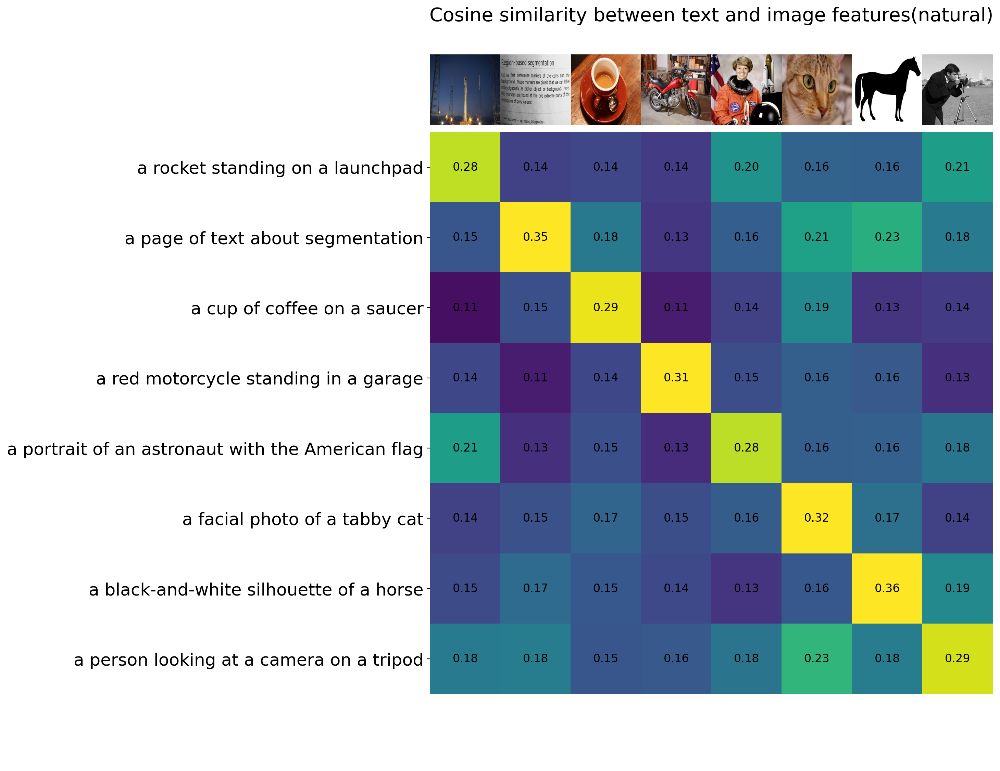

In [ ]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(natural)", size=20)

### Performance of CLIP in medical domain

In [25]:
# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
# !mkdir -p drive
# !google-drive-ocamlfuse drive
print(base_working_dir)

Mounted at /content/drive
/content/drive/MyDrive


100%|██████████| 8/8 [01:57<00:00, 14.65s/it]


Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

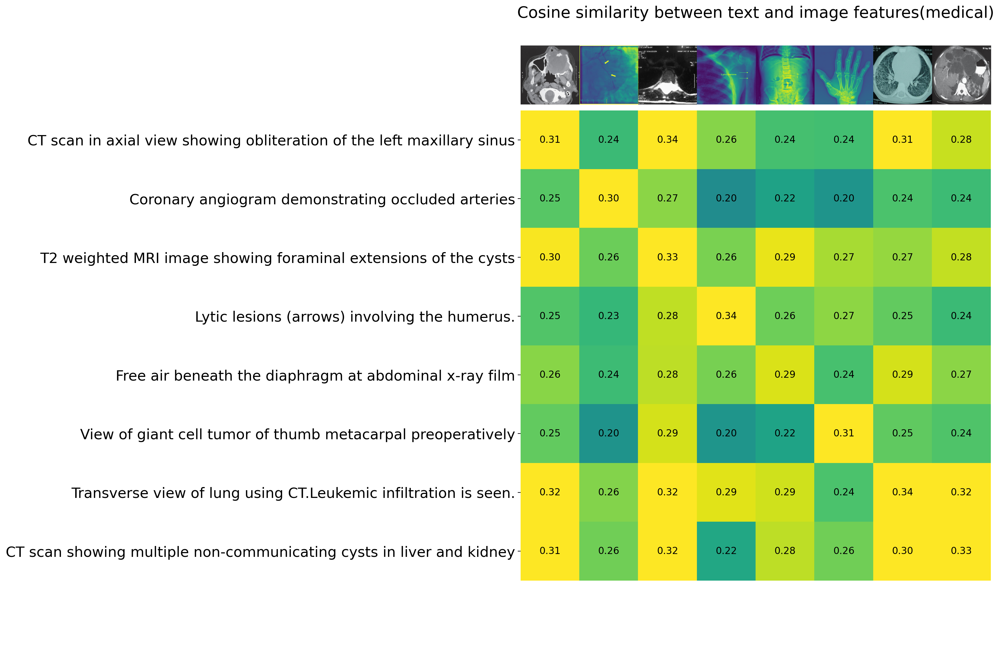

In [ ]:
original_images = []
images = []
texts = []
tr_path = "/content/drive/MyDrive/M2/Aidealadecision/data/pretrain_data/roco/train/radiology/images"
from tqdm import tqdm

for filename in tqdm(list(med_descriptions.keys())):
    image = Image.open(os.path.join(tr_path, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])

image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

# make features & calculate similarities for every paire
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T


# draw
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


## Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [ ]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

100%|██████████| 169001437/169001437 [00:04<00:00, 41943297.37it/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache


In [ ]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [ ]:
print(text_tokens[0], text_tokens[0].shape)

tensor([49406,   589,   533,   320,  1125,   539,   320,  3055, 49407,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0], device='cuda:0',
       dtype=torch.int32) torch.Size([77])


In [ ]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

# zero-shot
text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

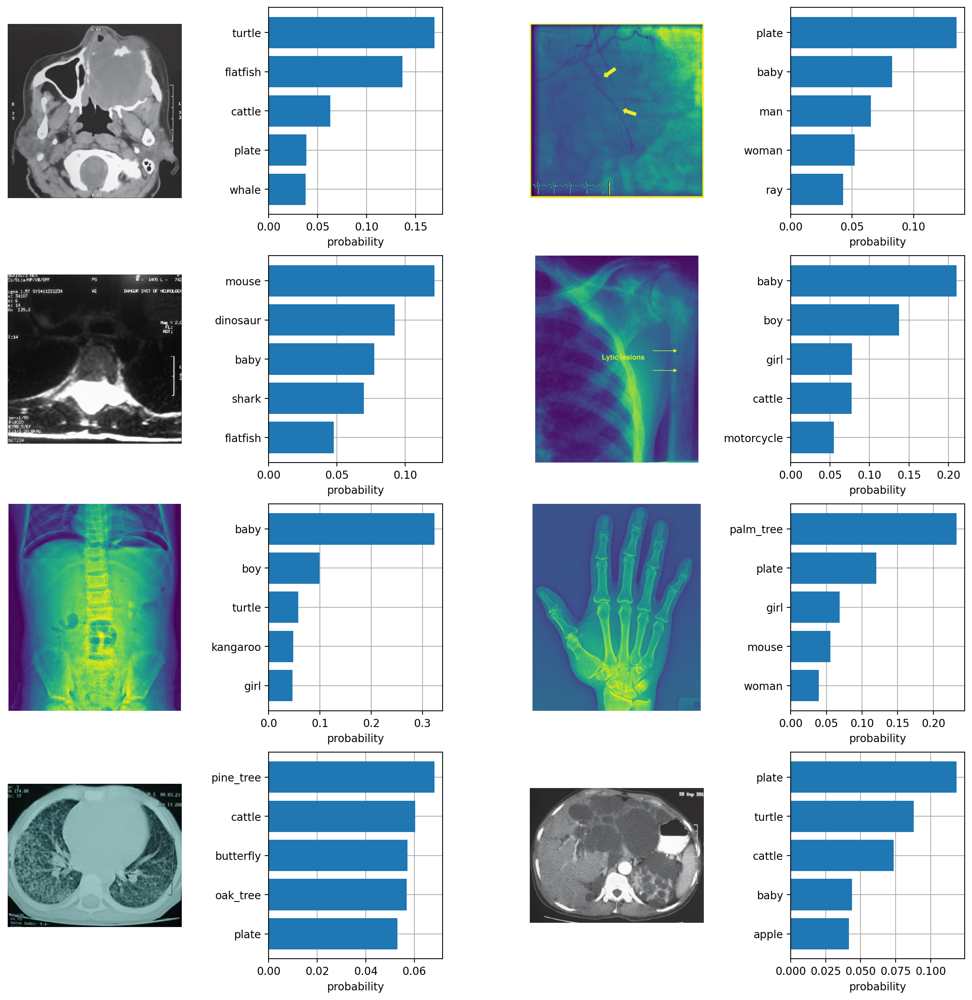

In [ ]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

## Fine-tuning CLIP on ROCO



In [ ]:
# dataset location
csv_file ="/content/drive/MyDrive/M2/Aidealadecision/data/roco-list.csv"
root_dir = "/content/drive/MyDrive/M2/Aidealadecision/data/pretrain_data/roco/train/radiology/images"
val_csv_file = "/content/drive/MyDrive/M2/Aidealadecision/data/local-val-list.csv"
val_root_dir = "/content/drive/MyDrive/M2/Aidealadecision/data/pretrain_data/roco/val/radiology/images"

# train options
seed = 42
batch_size = 48
image_size = 224
start_epoch = 0
epochs = 5
visual_encoder = "clip@ViT-B/16"
learning_rate = 3e-6
model_path = "/content/drive/MyDrive/M2/Aidealadecision" # set to the directory containing `checkpoint_##.tar`
txtpath = '/content/drive/MyDrive/M2/Aidealadecision'

In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import datetime
import time
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torch.utils.data import Dataset
import random
import clip



class CLRDataset(Dataset):
    """Contrastive Learning Representations Dataset."""

    def __init__(self, csv_file, root_dir, transform=None, clip=False):
        self.clr_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.clip = clip

    def __len__(self):
        return len(self.clr_frame)

    def text_sampling(self, text):
        text = text.replace("\n", " ")
        text = text.split(".")
        if '' in text:
            text.remove('')
        text = random.choice(text)
        return text

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.clr_frame.iloc[idx, 0]
                                )
        if not os.path.exists(img_name):
            img_name=img_name.replace('train','val')
        image = Image.open(img_name)
        if not self.clip:
            image = image.convert('RGB')
        text = self.clr_frame.iloc[idx, 1]
        name = self.clr_frame.iloc[idx, 0]
        sample = {'image': image, 'text': text,'name':name}
        if self.clip:
            sample = self.transform(sample['image']), sample['text'],sample['name'] #self.text_sampling(sample['text'])
        elif self.transform:
            sample = self.transform(sample)

        return sample


def load_optimizer( model, lr=3e-6):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, epochs, eta_min=0, last_epoch=-1
    )
    return optimizer, scheduler


def train( train_loader, model, tokenizer, optimizer,truncation):
    loss_epoch = 0
    for step, (images, texts,name) in tqdm(enumerate(train_loader)):

        optimizer.zero_grad()
        x_v = images.to('cuda')
        x_u = tokenizer(list(texts), truncate=True).to('cuda')

        v,u=model(x_v,x_u)

        labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

        loss_img = torch.nn.CrossEntropyLoss()
        loss_txt = torch.nn.CrossEntropyLoss()

        img_loss = loss_img(v,labels)
        text_loss = loss_txt(u,labels)

        loss = (img_loss + text_loss)/2

        loss.backward()
        optimizer.step()

        if step % 200 == 0:
            print(f"Step [{step}/{len(train_loader)}]\t Loss: {loss.item()}")

        loss_epoch += loss.item()
    return loss_epoch



def validate( val_loader, model, tokenizer, optimizer, truncation):

    with torch.no_grad():
        model.eval()
        loss_epoch = 0
        for step, (x_v, x_u, _) in enumerate(val_loader):
            x_v = x_v.to('cuda')
            x_u = tokenizer(list(x_u), truncate=True).to('cuda')

            v,u=model(x_v,x_u)

            labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

            loss_img = torch.nn.CrossEntropyLoss()
            loss_txt = torch.nn.CrossEntropyLoss()

            img_loss = loss_img(v,labels)
            text_loss = loss_txt(u,labels)

            loss = (img_loss + text_loss)/2
            loss_epoch += loss.item()

    model.train()
    return loss_epoch


def main(gpu):

    is_master=True

    # set GPU device
    torch.cuda.set_device(gpu)
    torch.manual_seed(seed)
    np.random.seed(seed)

    # initialize model
    print("Initializing model... ", end="", flush=True)
    model, preprocess = clip.load(visual_encoder.split("@")[-1], device='cuda', jit=False)
    model.float()
    tokenizer=clip.tokenize
    train_fonction = train
    validate_fonction = validate

    # optimizer
    optimizer, scheduler = load_optimizer(model, lr=float(learning_rate))

    # initialize dataloader
    transform = preprocess
    print('Image_Transform',transform)
    train_dataset = CLRDataset(csv_file=csv_file,
                               root_dir=root_dir,
                               transform=transform,
                               clip = True
                               )

    val_dataset = CLRDataset(csv_file=val_csv_file,
                             root_dir=val_root_dir,
                             transform=transform,
                             clip = True
                             )

    train_sampler = None
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        drop_last=True,
        num_workers=8,
        sampler=train_sampler,
    )

    val_loader = torch.utils.data.DataLoader(
        val_dataset,
        batch_size=batch_size,
        drop_last=True,
        num_workers=8
    )

    print("[DONE]\n")
    print("STARTING TRAINING")
    print('Start Time =', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

    t0 = time.time()
    global_step = 0
    current_epoch = 0
    best_val_loss = np.inf

    TRLOSSES = []
    VALOSSES = []
    for epoch in range(0, epochs):
        if epoch<5:
            if train_sampler is not None:
                train_sampler.set_epoch(epoch)

            lr = optimizer.param_groups[0]["lr"]
            loss_epoch = train_fonction(train_loader, model, tokenizer, optimizer,True)
            TRLOSSES.append(loss_epoch)
        if is_master:
            val_loss = validate_fonction( val_loader, model, tokenizer, optimizer, True)
            if val_loss < best_val_loss:
                torch.save(model.state_dict(), os.path.join(model_path, "best_checkpoint_5.pth"))
                best_val_loss = val_loss
                print("best checkpoint updated !")

            VALOSSES.append(val_loss)
            epoch_counter = epoch - 0
            elapsed = time.time() - t0
            epoch_time = elapsed/(epoch_counter+1)
            remaining = (epochs - (epoch_counter+1))*epoch_time
            remaining = str(datetime.timedelta(seconds=round(remaining)))
            elapsed = str(datetime.timedelta(seconds=round(elapsed)))
            print(f'Epoch {epoch_counter+1}/{epochs} [{elapsed}<{remaining}, {round(epoch_time, 2)}s/epoch] {round((epoch_counter+1)/epochs*100, 1)}% loss: {loss_epoch / len(train_loader)}\t val_loss: {val_loss / len(val_loader)} lr: {lr}')

            current_epoch += 1

    # save losses
    f = open(os.path.join(txtpath, "loss.txt"), 'w')
    f.write(str(TRLOSSES)+"\n")
    f.write(str(VALOSSES))
    f.close()


# [Consigne] 2.

In [ ]:
for m in clip.available_models():
    model, prep = clip.load(m)
    print(f"Model: {m}")
    print(f"Preprocess: {prep}")
    print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
    print("Input resolution:", model.visual.input_resolution)
    print("Context length:", model.context_length)
    print("Vocab size:", model.vocab_size)
    del model, prep

100%|████████████████████████████████████████| 244M/244M [00:02<00:00, 107MiB/s]


Model: RN50
Preprocess: Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 102,007,137
Input resolution: 224
Context length: 77
Vocab size: 49408


100%|████████████████████████████████████████| 278M/278M [00:02<00:00, 108MiB/s]


Model: RN101
Preprocess: Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 119,688,033
Input resolution: 224
Context length: 77
Vocab size: 49408


100%|███████████████████████████████████████| 402M/402M [00:05<00:00, 76.5MiB/s]


Model: RN50x4
Preprocess: Compose(
    Resize(size=288, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(288, 288))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 178,300,601
Input resolution: 288
Context length: 77
Vocab size: 49408


100%|███████████████████████████████████████| 630M/630M [00:07<00:00, 86.0MiB/s]


Model: RN50x16
Preprocess: Compose(
    Resize(size=384, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(384, 384))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 290,979,217
Input resolution: 384
Context length: 77
Vocab size: 49408


100%|██████████████████████████████████████| 1.26G/1.26G [00:12<00:00, 108MiB/s]


Model: RN50x64
Preprocess: Compose(
    Resize(size=448, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(448, 448))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 623,258,305
Input resolution: 448
Context length: 77
Vocab size: 49408


100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 185MiB/s]


Model: ViT-B/32
Preprocess: Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408
Model: ViT-B/16
Preprocess: Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 149,620,737
Input resolution: 224
Context length: 77
Vocab size: 49408


100%|████████████████████████████████████████| 890M/890M [00:07<00:00, 120MiB/s]


Model: ViT-L/14
Preprocess: Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 427,616,513
Input resolution: 224
Context length: 77
Vocab size: 49408


100%|███████████████████████████████████████| 891M/891M [00:14<00:00, 62.7MiB/s]


Model: ViT-L/14@336px
Preprocess: Compose(
    Resize(size=336, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(336, 336))
    <function _convert_image_to_rgb at 0x7b5fc453b0a0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Model parameters: 427,944,193
Input resolution: 336
Context length: 77
Vocab size: 49408


In [ ]:
# cifar10, mnist
from torchvision.datasets import CIFAR10, MNIST
mnist = MNIST(root=os.path.expanduser("~/.cache"), download=True, train=False)
cifar10 = CIFAR10(root=os.path.expanduser("~/.cache"), download=True, train=False)

100%|██████████| 9912422/9912422 [00:00<00:00, 116638596.95it/s]

Extracting /root/.cache/MNIST/raw/train-images-idx3-ubyte.gz to /root/.cache/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 105243869.53it/s]


Extracting /root/.cache/MNIST/raw/train-labels-idx1-ubyte.gz to /root/.cache/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 34367580.85it/s]

Extracting /root/.cache/MNIST/raw/t10k-images-idx3-ubyte.gz to /root/.cache/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 17162638.53it/s]


Extracting /root/.cache/MNIST/raw/t10k-labels-idx1-ubyte.gz to /root/.cache/MNIST/raw



100%|██████████| 170498071/170498071 [00:13<00:00, 12832774.44it/s]


Extracting /root/.cache/cifar-10-python.tar.gz to /root/.cache


In [ ]:
# classes
cls_cifar10 = cifar10.classes
cls_mnist = []
for cls in mnist.classes:
    cls_mnist.append(cls[4:])

print(cls_cifar10)
print(cls_mnist)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
['zero', 'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine']


In [ ]:
# class to text
cifar10_descriptions = [f"This is a photo of a {label}" for label in cls_cifar10]
mnist_descriptions = [f"This is a photo of a {label}" for label in cls_mnist]
# tokenizing
cifar10_tokens = clip.tokenize(cifar10_descriptions).cuda()
mnist_tokens = clip.tokenize(mnist_descriptions).cuda()

In [128]:
# Zero-shot images prediction for all models
models = clip.available_models()
res = {m:[] for m in models}
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"device: {device}")

for m in models:
    # load model
    model, preprocess = clip.load(m)
    model.cuda().eval()
    print(f"model: {m}")

    # zero-shot
    for dset in [cifar10, mnist]:
        top1 = 0
        top5 = 0

        # image features
        image_features = []
        image_labels = []
        for image, cls in tqdm(dset):
            image_input = preprocess(image).unsqueeze(0).to(device)
            with torch.no_grad():
                image_feature = model.encode_image(image_input).float()
            image_feature /= image_feature.norm(dim=-1, keepdim=True)
            image_features.append(image_feature)
            image_labels.append(cls)

        image_features = torch.stack(image_features, dim=1).to(device)
        image_features = image_features.squeeze()

        # text features
        if dset == cifar10:
            # for token in cifar10_tokens:
            with torch.no_grad():
                text_features = model.encode_text(cifar10_tokens).float()
            text_features /= text_features.norm(dim=-1, keepdim=True)
        elif dset == mnist:
            # for token in mnist_tokens:
            with torch.no_grad():
                text_features = model.encode_text(mnist_tokens).float()
            text_features /= text_features.norm(dim=-1, keepdim=True)

        text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
        top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

        for toplb, gt in zip(top_labels, image_labels):
            # top1
            if gt == toplb[0]:
                top1 += 1
            # top5
            if gt in toplb:
                top5 += 1
        t1t5 = (top1/10000*100, top5/10000*100)
        res[m].append(t1t5)
        print(res)
    del model, preprocess

device: cuda
model: RN50


100%|██████████| 10000/10000 [02:08<00:00, 77.76it/s]


{'RN50': [(71.82, 97.27)], 'RN101': [], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [02:08<00:00, 77.71it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 278M/278M [00:06<00:00, 47.0MiB/s]


model: RN101


100%|██████████| 10000/10000 [04:52<00:00, 34.15it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001)], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [04:06<00:00, 40.59it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 402M/402M [00:08<00:00, 47.9MiB/s]


model: RN50x4


100%|██████████| 10000/10000 [03:13<00:00, 51.65it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87)], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [03:11<00:00, 52.26it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 630M/630M [00:10<00:00, 60.2MiB/s]


model: RN50x16


100%|██████████| 10000/10000 [05:02<00:00, 33.09it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001)], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [04:51<00:00, 34.30it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|█████████████████████████████████████| 1.26G/1.26G [00:30<00:00, 45.1MiB/s]


model: RN50x64


100%|██████████| 10000/10000 [09:22<00:00, 17.79it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33)], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [09:17<00:00, 17.95it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 129MiB/s]


model: ViT-B/32


100%|██████████| 10000/10000 [02:13<00:00, 74.76it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37)], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [02:11<00:00, 75.92it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|████████████████████████████████████████| 335M/335M [00:03<00:00, 112MiB/s]


model: ViT-B/16


100%|██████████| 10000/10000 [02:11<00:00, 76.09it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08)], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [02:09<00:00, 77.18it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08), (30.409999999999997, 79.91)], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|████████████████████████████████████████| 890M/890M [00:07<00:00, 120MiB/s]


model: ViT-L/14


100%|██████████| 10000/10000 [03:56<00:00, 42.34it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08), (30.409999999999997, 79.91)], 'ViT-L/14': [(95.04, 99.55000000000001)], 'ViT-L/14@336px': []}


100%|██████████| 10000/10000 [03:50<00:00, 43.43it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08), (30.409999999999997, 79.91)], 'ViT-L/14': [(95.04, 99.55000000000001), (51.6, 81.87)], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 891M/891M [00:27<00:00, 34.0MiB/s]


model: ViT-L/14@336px


100%|██████████| 10000/10000 [04:53<00:00, 34.06it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08), (30.409999999999997, 79.91)], 'ViT-L/14': [(95.04, 99.55000000000001), (51.6, 81.87)], 'ViT-L/14@336px': [(95.00999999999999, 99.55000000000001)]}


100%|██████████| 10000/10000 [04:50<00:00, 34.43it/s]


{'RN50': [(71.82, 97.27), (14.46, 72.78)], 'RN101': [(77.07000000000001, 98.07000000000001), (36.08, 76.35)], 'RN50x4': [(76.32, 97.87), (28.910000000000004, 82.39999999999999)], 'RN50x16': [(80.12, 97.96000000000001), (42.41, 81.78)], 'RN50x64': [(81.11, 95.33), (61.050000000000004, 83.87)], 'ViT-B/32': [(88.92999999999999, 99.37), (20.79, 58.98)], 'ViT-B/16': [(89.16, 99.08), (30.409999999999997, 79.91)], 'ViT-L/14': [(95.04, 99.55000000000001), (51.6, 81.87)], 'ViT-L/14@336px': [(95.00999999999999, 99.55000000000001), (54.66, 81.87)]}


In [22]:
# visualization
import matplotlib.pyplot as plt
import numpy as np

def visualize(res, dataset:str):
    # Exemple de données
    if dataset == 'cifar10':
        values1 = [t1t5[0] for t1t5, _ in res.values()]
        values2 = [t1t5[1] for t1t5, _ in res.values()]
    elif dataset == 'mnist':
        values1 = [t1t5[0] for _, t1t5 in res.values()]
        values2 = [t1t5[1] for _, t1t5 in res.values()]

    # Créer un tableau d'indices pour les positions des barres
    indices = np.arange(len(models))

    # Largeur des barres
    bar_width = 0.35

    # Tracer les barres
    plt.figure(figsize=(15, 6))
    bar1 = plt.bar(indices, values1, bar_width, label='Top 1', color='#8A2BE2')
    bar2 = plt.bar(indices + bar_width, values2, bar_width, label='Top 5', color='#00FFFF')

    # Ajouter des étiquettes et un titre
    plt.xlabel('models')
    plt.ylabel('accuracy')
    if dataset == 'cifar10':
        plt.title('CIFAR10 - top1/top5 accuracy')
    elif dataset == 'mnist':
        plt.title('MNIST - top1/top5 accuracy')
    plt.xticks(indices + bar_width / 2, models)  # Positionner les étiquettes sur l'axe des x

    # Ajouter une légende
    plt.legend()

    # Ajouter les valeurs sur les barres
    for bar in bar1:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

    for bar in bar2:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

    plt.ylim(top=100)

    # Afficher le graphique
    plt.show()

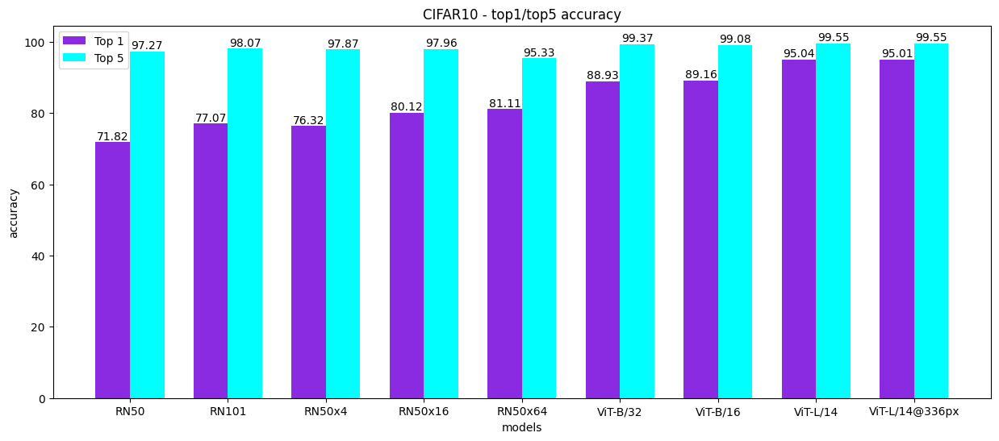

In [23]:
visualize(res, 'cifar10')

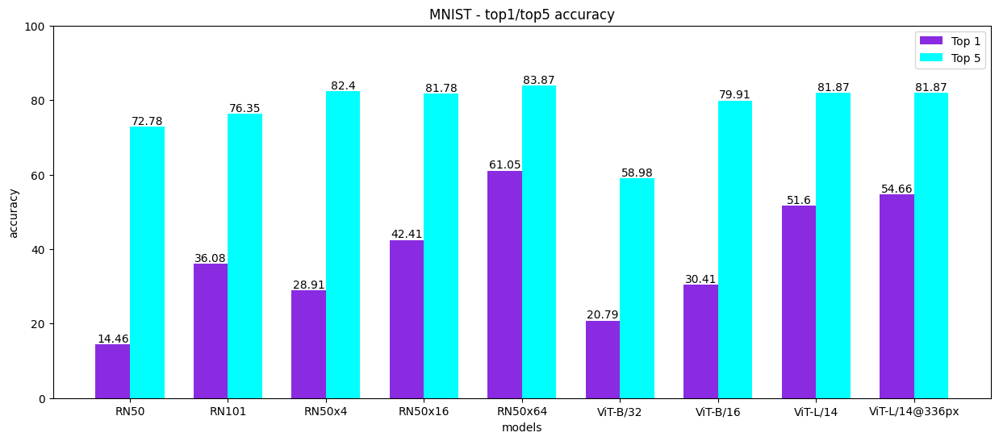

In [20]:
visualize(res, 'mnist')

# [Consigne] 3.
Montrer les résultats de CLIP dans le domaine médical sur d’autres exemples
du jeu de données

In [ ]:
# L'entrainement
if not os.path.exists(model_path):
    os.makedirs(model_path)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
main(0)

Device: cuda:0
Initializing model... Image_Transform Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7feef258dea0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
[DONE]

STARTING TRAINING
Start Time = 22:58:17 



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
1it [00:19, 19.12s/it]

Step [0/1362]	 Loss: 2.5664572715759277


201it [07:41,  2.18s/it]

Step [200/1362]	 Loss: 1.2979636192321777


401it [14:59,  2.17s/it]

Step [400/1362]	 Loss: 1.285546898841858


601it [22:23,  2.14s/it]

Step [600/1362]	 Loss: 1.2068743705749512


801it [29:50,  2.13s/it]

Step [800/1362]	 Loss: 1.4204957485198975


1001it [37:15,  2.14s/it]

Step [1000/1362]	 Loss: 0.73289954662323


1201it [44:48,  2.15s/it]

Step [1200/1362]	 Loss: 0.9177628755569458


1362it [50:55,  2.24s/it]


best checkpoint updated !
Epoch 1/5 [0:57:20<3:49:20, 3439.99s/epoch] 20.0% loss: 1.2235568862917139	 val_loss: 0.9985864758491516 lr: 3e-06


1it [00:07,  7.10s/it]

Step [0/1362]	 Loss: 1.1017698049545288


201it [07:09,  2.12s/it]

Step [200/1362]	 Loss: 0.7339506149291992


401it [14:11,  2.11s/it]

Step [400/1362]	 Loss: 0.763617753982544


601it [21:11,  2.10s/it]

Step [600/1362]	 Loss: 0.6653976440429688


801it [28:13,  2.11s/it]

Step [800/1362]	 Loss: 0.5669010877609253


1001it [35:13,  2.11s/it]

Step [1000/1362]	 Loss: 0.6361647248268127


1201it [42:15,  2.11s/it]

Step [1200/1362]	 Loss: 0.5008100271224976


1362it [47:55,  2.11s/it]


best checkpoint updated !
Epoch 2/5 [1:47:24<2:41:07, 3222.22s/epoch] 40.0% loss: 0.7005811813513088	 val_loss: 0.8615126418716768 lr: 3e-06


1it [00:05,  5.23s/it]

Step [0/1362]	 Loss: 0.5264540910720825


201it [07:06,  2.11s/it]

Step [200/1362]	 Loss: 0.5354418158531189


401it [14:07,  2.11s/it]

Step [400/1362]	 Loss: 0.4969708323478699


601it [21:09,  2.11s/it]

Step [600/1362]	 Loss: 0.4454958438873291


801it [28:12,  2.13s/it]

Step [800/1362]	 Loss: 0.36350953578948975


1001it [35:13,  2.11s/it]

Step [1000/1362]	 Loss: 0.2394137680530548


1201it [42:15,  2.11s/it]

Step [1200/1362]	 Loss: 0.4678562879562378


1362it [47:56,  2.11s/it]


best checkpoint updated !
Epoch 3/5 [2:37:33<1:45:02, 3151.15s/epoch] 60.0% loss: 0.47260173682599343	 val_loss: 0.8452860348364886 lr: 3e-06


1it [00:05,  5.30s/it]

Step [0/1362]	 Loss: 0.21229761838912964


201it [07:07,  2.12s/it]

Step [200/1362]	 Loss: 0.2605912983417511


401it [14:08,  2.10s/it]

Step [400/1362]	 Loss: 0.358856737613678


601it [21:10,  2.11s/it]

Step [600/1362]	 Loss: 0.2839067280292511


801it [28:11,  2.11s/it]

Step [800/1362]	 Loss: 0.404022216796875


1001it [35:13,  2.10s/it]

Step [1000/1362]	 Loss: 0.4253145456314087


1201it [42:14,  2.11s/it]

Step [1200/1362]	 Loss: 0.4697113633155823


1362it [47:54,  2.11s/it]


Epoch 4/5 [3:27:36<0:51:54, 3114.04s/epoch] 80.0% loss: 0.3241593938774912	 val_loss: 0.9032833804102505 lr: 3e-06


1it [00:05,  5.74s/it]

Step [0/1362]	 Loss: 0.31515493988990784


201it [07:07,  2.11s/it]

Step [200/1362]	 Loss: 0.19977593421936035


401it [14:08,  2.10s/it]

Step [400/1362]	 Loss: 0.3158963620662689


601it [21:09,  2.11s/it]

Step [600/1362]	 Loss: 0.260071337223053


711it [25:01,  2.11s/it]


FileNotFoundError: ignored

## Performance of CLIP in medical domain(after fine-tuning on ROCO )

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

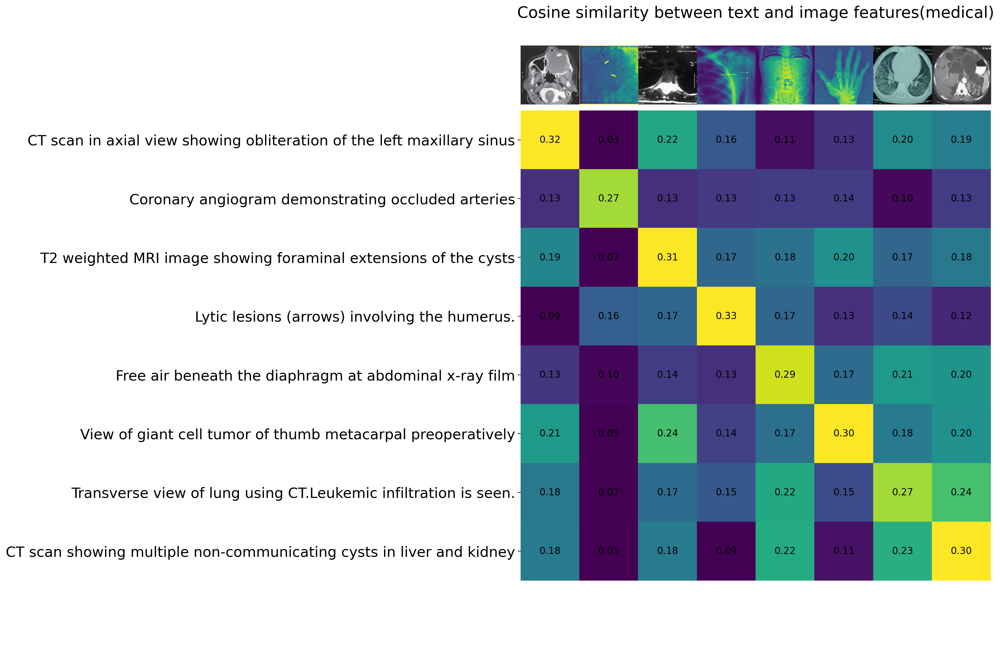

In [ ]:
#load checkpoint
model.load_state_dict(torch.load('/content/drive/MyDrive/M2/Aidealadecision/best_checkpoint_5.pth'))

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

In [ ]:
# Test avec d'autres exemples
med_descriptions = {
    "ROCO_00001": "Axial MRI (coronal view)",
    "ROCO_00006": "Coronal plain computed tomography image showing multiple large tumor masses with edge enhancement inside the abdominal cavity and liver",
    "ROCO_00016": "Axial source image from an intracranial magnetic resonance angiogram reveals abnormal arterial signal elevation in the left more than right cavernous sinuses consistent with a carotid cavernous fistula, as indicated by the arrow",
    "ROCO_00025": "The apical height, homogeneity, and the thickness of mineral trioxide aggregate plug",
    "ROCO_00031": "CTO of RCA (closure in the 2nd segment)",
    "ROCO_00036": "Venography shows a large amount of thrombogenesis in the femoropoplitea vein before thrombolysis",
    "ROCO_00061": "Postoperative decreased size of the cyst",
    "ROCO_00084": "Fetal aortic arch. The solid arrow represents the ascending aorta while the dotted arrow represents the aortic arch distal to the ductus arteriosus"
}

In [ ]:
root_dir = "/content/drive/MyDrive/M2/Aidealadecision/data/pretrain_data/roco/test/radiology/images"
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(root_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in med_descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{med_descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[name])

plt.tight_layout()


Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

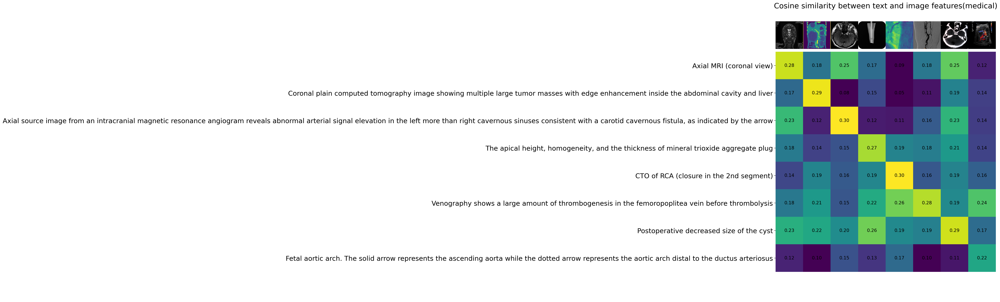

In [ ]:
#load checkpoint
model.load_state_dict(torch.load('/content/drive/MyDrive/M2/Aidealadecision/best_checkpoint_5.pth'))
root_dir = "/content/drive/MyDrive/M2/Aidealadecision/data/pretrain_data/roco/test/radiology/images"

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(med_descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

# [Consigne] 4. Classification (l'entrainement) : ImageNet1000

In [4]:
modellist = clip.available_models()
print(modellist)

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']


In [5]:
# Download the dataset - ImageNet1000
import shutil
datapath = "/content/drive/MyDrive/M2/Image/SupervisedLearning/imagenet.zip"
imagenet = shutil.unpack_archive(datapath)

In [6]:
class Config():
    root = "/content/drive/MyDrive/M2/Image/SupervisedLearning"
    data1000 = "imagenet.zip"
    trainPath = "/content/imagenet-mini/train"
    validPath = "/content/imagenet-mini/val"
    testPath = "/content/imagenet-mini/test"

In [7]:
def split_test(nb_classes):
    from tqdm import tqdm
    assert nb_classes in [10, 1000]

    if nb_classes == 10:
        standardPath = Config.validPath10
        if not os.path.exists(Config.testPath10):
            os.mkdir(Config.testPath10)
    elif nb_classes == 1000:
        standardPath = Config.trainPath
        if not os.path.exists(Config.testPath):
            os.mkdir(Config.testPath)

    imgPaths = os.listdir(standardPath)

    for path in tqdm(imgPaths):
        tempPath = os.path.join(standardPath, path)
        imgs = sorted(os.listdir(tempPath)) # sorted list
        for i, img in enumerate(imgs):
            srcFile = os.path.join(tempPath, img)
            if nb_classes == 10:
                dstFile = srcFile.replace("val", "test")
                if i == 200:
                    break
            elif nb_classes == 1000:
                dstFile = srcFile.replace("train", "test")
                if i == 2:
                    break
            dstPath = os.path.dirname(dstFile)
            if not os.path.exists(dstPath):
                os.mkdir(dstPath)
            shutil.move(srcFile, dstFile)
    print("\nTest dataset is created !")

In [8]:
class Preprocess():
    def __init__(self):
        pass

    def process(self, path):
        root = path
        data, GTs = [], []
        imgpaths = os.listdir(path)
        if '.DS_Store' in imgpaths:
            imgpaths.remove('.DS_Store')
        for gt, item in enumerate(imgpaths):
            imgs = os.listdir(os.path.join(root, item))
            for img in imgs:
                final = os.path.join(root, item, img)
                data.append(final)
                GTs.append(gt)
        return data, GTs

    def execute(self, nb_classes):
        assert nb_classes in [10, 1000]
        if nb_classes == 10:
            TRAIN, TGTs = self.process(Config.trainPath10)
            VALID, VGTs = self.process(Config.validPath10)
            TEST, TSGTs = self.process(Config.testPath10)
        elif nb_classes == 1000:
            TRAIN, TGTs = self.process(Config.trainPath)
            VALID, VGTs = self.process(Config.validPath)
            TEST, TSGTs = self.process(Config.testPath)
        print(f"Numbers of train data : {len(TRAIN)}")
        print(f"Numbers of valid data : {len(VALID)}")
        print(f"Numbers of test data  : {len(TEST)}")
        return TRAIN, TGTs, VALID, VGTs, TEST, TSGTs

In [9]:
split_test(nb_classes=1000)

100%|██████████| 1000/1000 [00:00<00:00, 5412.80it/s]


Test dataset is created !


In [10]:
processer = Preprocess()
train, trGT, valid, vlGT, test, tsGT = processer.execute(nb_classes=1000)

Numbers of train data : 32745
Numbers of valid data : 3923
Numbers of test data  : 2000


In [11]:
# Le nombre de classes : 300 (au lieu de 1000 en raison de manque des ressources de colab)
tridx, vlidx, tsidx = trGT.index(300), vlGT.index(300), tsGT.index(300)
train, trGT = train[:tridx], trGT[:tridx]
valid, vlGT = valid[:vlidx], vlGT[:vlidx]
test, tsGT = test[:tsidx], tsGT[:tsidx]
print(f"Numbers of train data (class 300) : {len(train)}, {len(trGT)}")
print(f"Numbers of valid data (class 300) : {len(valid)}, {len(vlGT)}")
print(f"Numbers of test data (class 300)  : {len(test)}, {len(tsGT)}")

Numbers of train data (class 300) : 9674, 9674
Numbers of valid data (class 300) : 1148, 1148
Numbers of test data (class 300)  : 600, 600


In [12]:
# Custom dataset class
from torch.utils.data import Dataset, DataLoader
class CustomDataset(Dataset):
    def __init__(self, image_dirs, labels, transform=None):
        self.image_dirs = image_dirs
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_dirs)

    def __getitem__(self, idx):
        image_path = self.image_dirs[idx]
        label = self.labels[idx]
        image = Image.open(image_path)
        if self.transform:
            image = self.transform(image)

        return image, label

In [13]:
class CustomCLIPClassifier(torch.nn.Module):
    def __init__(self, num_classes, model):
        super(CustomCLIPClassifier, self).__init__()

        self.clip_model, self.transform = clip.load(model, device="cuda" if torch.cuda.is_available() else "cpu")

        # Obtenir la dimension des embeddings bruts de CLIP
        num_inputs = self.clip_model.visual.output_dim

        self.classifier = torch.nn.Linear(num_inputs, num_classes)

        # all to float
        self.float()

    def get_transform(self):
        return self.clip_model, self.transform

    def forward(self, inputs):
        # Obtenez les embeddings bruts à partir du modèle CLIP
        image_features = self.clip_model.encode_image(inputs)

        # Passez les embeddings concaténés à travers la couche linéaire pour la classification
        logits = self.classifier(image_features)

        return logits

In [14]:
# model - RN50
device = "cuda" if torch.cuda.is_available() else "cpu"
m = modellist[0]
num_cls = 300

# model with classifier
model_with_classifier = CustomCLIPClassifier(num_cls, m)
model, transform = model_with_classifier.get_transform()

100%|███████████████████████████████████████| 244M/244M [00:02<00:00, 88.2MiB/s]


In [15]:
# make datasets
train_dataset = CustomDataset(train, trGT, transform=transform)
valid_dataset = CustomDataset(valid, vlGT, transform=transform)
test_dataset = CustomDataset(test, tsGT, transform=transform)

In [16]:
# make dataloaders
batch_size = 80
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [17]:
# Fine-tuning
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_with_classifier.parameters(), lr=3e-4)

In [20]:
def train_func(model, train_loader, valid_loader, epochs):
    global_trn_loss = [0 for _ in range(epochs)]
    global_val_loss = [0 for _ in range(epochs)]
    global_val_acc = [0 for _ in range(epochs)]
    best_accuracy = 0.0

    import time
    start_time = time.time()
    for epoch in range(epochs):
        train_running_loss = []
        val_running_loss = []

        model.cuda().train()
        for inputs, labels in tqdm(train_loader):
            images = inputs.to(device)
            labels = labels.to(device)

            # Passez les embeddings bruts à travers la couche linéaire pour la classification
            logits = model(images)

            # Calculez la perte
            loss = criterion(logits, labels)

            # Rétropropagation et mise à jour des poids
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_running_loss.append(loss.item())

        # Boucle d'évaluation
        val_loss = 0.0
        correct = 0
        total = 0
        model.cuda().eval()
        with torch.no_grad():
            for inputs, labels in tqdm(valid_loader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Passez les embeddings bruts à travers la couche linéaire pour la classification
                logits = model(inputs)

                # Calculez la perte
                loss = criterion(logits, labels)
                val_running_loss.append(loss.item())

                # Calculez la précision
                _, predicted = logits.max(1)
                total += labels.size(0)
                correct += predicted.eq(labels).sum().item()

        global_trn_loss[epoch] = sum(train_running_loss) / len(train_running_loss)
        global_val_loss[epoch] = sum(val_running_loss) / len(val_running_loss)
        global_val_acc[epoch] = (100 * correct / total)

        # Affichez la perte et la précision pour l'ensemble de validation
        print(f'Epoch {epoch + 1}, Train Loss: {global_trn_loss[epoch]:.4f}, Validation Loss: {global_val_loss[epoch]:.4f}, Validation Accuracy: {global_val_acc[epoch]:.2f}%')
        print('Time:{:.2f}'.format((time.time() - start_time) / 60))

        # Vérifiez si la précision actuelle est meilleure que la meilleure précision précédente
        if global_val_acc[epoch] > best_accuracy:
            # Sauvegardez les poids du modèle
            torch.save(model.state_dict(), f"/content/drive/MyDrive/M2/Aidealadecision/{m}_best_weights_300.pth")
            # Mettez à jour la meilleure précision
            best_accuracy = global_val_acc[epoch]
            print("weight file saved !")

    return global_trn_loss, global_val_loss, global_val_acc

In [ ]:
global_trn_loss, global_val_loss, global_val_acc = train_func(model_with_classifier, train_loader, valid_loader, epochs = 10)

100%|██████████| 15/15 [00:14<00:00,  1.01it/s]


Epoch 1, Train Loss: 4.2820, Validation Loss: 4.5457, Validation Accuracy: 7.49%
Time:3.49
weight file saved !


100%|██████████| 15/15 [00:14<00:00,  1.00it/s]


Epoch 2, Train Loss: 3.6302, Validation Loss: 4.6332, Validation Accuracy: 9.49%
Time:6.97
weight file saved !


100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


Epoch 3, Train Loss: 3.0368, Validation Loss: 5.4170, Validation Accuracy: 7.58%
Time:10.42


100%|██████████| 15/15 [00:13<00:00,  1.08it/s]


Epoch 4, Train Loss: 2.4401, Validation Loss: 3.6313, Validation Accuracy: 19.86%
Time:13.85
weight file saved !


100%|██████████| 15/15 [00:14<00:00,  1.02it/s]


Epoch 5, Train Loss: 1.8370, Validation Loss: 3.5435, Validation Accuracy: 25.44%
Time:17.33
weight file saved !


100%|██████████| 15/15 [00:14<00:00,  1.01it/s]


Epoch 6, Train Loss: 1.2450, Validation Loss: 4.2085, Validation Accuracy: 22.30%
Time:20.79


100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


Epoch 7, Train Loss: 0.7497, Validation Loss: 4.7789, Validation Accuracy: 20.56%
Time:24.46


100%|██████████| 15/15 [00:22<00:00,  1.51s/it]


Epoch 8, Train Loss: 0.4173, Validation Loss: 4.7311, Validation Accuracy: 23.34%
Time:28.41


100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


Epoch 9, Train Loss: 0.2826, Validation Loss: 4.9487, Validation Accuracy: 25.35%
Time:32.25


100%|██████████| 15/15 [00:13<00:00,  1.11it/s]

Epoch 10, Train Loss: 0.2494, Validation Loss: 4.9908, Validation Accuracy: 23.87%
Time:35.69


In [6]:
# trloss = [4.2820, 3.6302, 3.0368, 2.4401, 1.8370, 1.2450, 0.7497, 0.4173, 0.2826, 0.2494]
# valloss = [4.5457, 4.6332, 5.4170, 3.6313, 3.5435, 4.2085, 4.7789, 4.7311, 4.9487, 4.9908]
# valacc = [7.49, 9.49, 7.58, 19.86, 25.44, 22.30, 20.56, 23.34, 25.35, 23.87]

In [22]:
import matplotlib.pyplot as plt
import numpy as np
def LossAccDisplay(global_trn_loss, global_val_loss, global_val_acc):
    plt.figure(figsize=(12, 4))

    # Sous-graphique 1 (à gauche)
    plt.subplot(1, 2, 1)  # 1 ligne, 2 colonnes, sous-graphique 1
    plt.plot(list(range(1, 11)), global_trn_loss, 'b', label='Train Loss')
    plt.plot(list(range(1, 11)), global_val_loss, 'r', label='Valid Loss')
    plt.xlabel('Epoques')
    plt.ylabel('Loss')
    plt.title('Loss')
    plt.legend()

    # Sous-graphique 2 (à droite)
    plt.subplot(1, 2, 2)  # 1 ligne, 2 colonnes, sous-graphique 2
    plt.plot(list(range(1, 11)), global_val_acc, 'b', label='Valid Accyracy')
    plt.xlabel('Époques')
    plt.ylabel('Acc')
    plt.title('Accuracy')
    plt.legend()

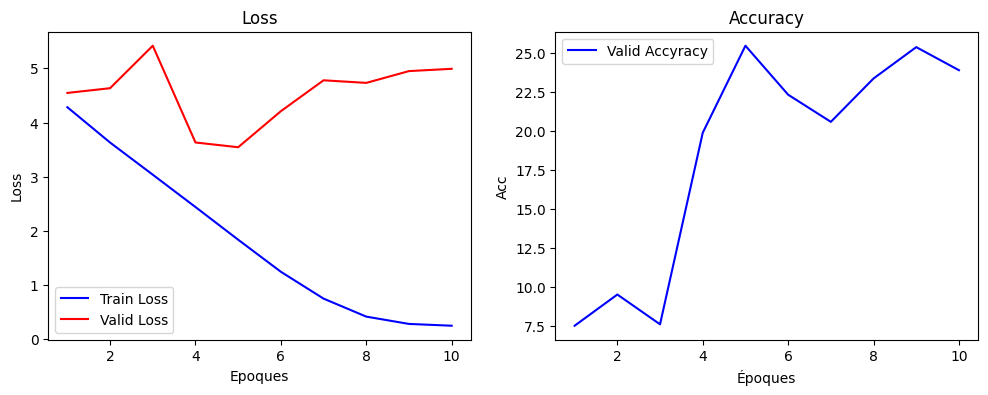

In [8]:
LossAccDisplay(global_trn_loss, global_val_loss, global_val_acc)

In [23]:
# test
def test_func(model, test_loader, test_dataset):
    running_loss = []
    total = 0
    correct = 0
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Passez les embeddings bruts à travers la couche linéaire pour la classification
            logits = model(inputs)

            # Calculez la perte
            loss = criterion(logits, labels)
            running_loss.append(loss.item())

            # Calculez la précision
            _, predicted = logits.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
        print('Test Progress --- total:{}, correct:{}'.format(total, correct))
        print(f'Test Accuracy of the network on the {len(test_dataset)} test images: {round(100 * correct / total, 2)}%')

In [ ]:
weight_path = "/content/drive/MyDrive/M2/Aidealadecision/RN50_best_weights.pth"
model_with_classifier.load_state_dict(torch.load(weight_path))
test_func(model_with_classifier, test_loader, test_dataset)

100%|██████████| 8/8 [00:08<00:00,  1.03s/it]

Test Progress --- total:600, correct:152
Test Accuracy of the network on the 600 test images: 25.33%


# [Consigne] 4. Classification (Zero-shot images prédiction) : ImageNet1000

In [31]:
# Imagenet class
path = "/content/drive/MyDrive/M2/Aidealadecision/imagenetclass.xlsx"
import pandas as pd
df = pd.read_excel(path)
imagenet_class = df['t_class'].tolist()
print(imagenet_class)

['tench, Tinca tinca', 'goldfish, Carassius auratus', "great white shark, white shark, man-eater, man-eating shark, Carcharodon caharias',", 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus', 'brambling, Fringilla montifringilla', 'goldfinch, Carduelis carduelis', 'house finch, linnet, Carpodacus mexicanus', 'junco, snowbird', 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 'robin, American robin, Turdus migratorius', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel, dipper', 'kite', 'bald eagle, American eagle, Haliaeetus leucocephalus', 'vulture', 'great grey owl, great gray owl, Strix nebulosa', 'European fire salamander, Salamandra salamandra', 'common newt, Triturus vulgaris', 'eft', 'spotted salamander, Ambystoma maculatum', 'axolotl, mud puppy, Ambystoma mexicanum', 'bullfrog, Rana catesbeiana', 'tree frog, tree-frog', 'tailed frog, bell toad, 

In [32]:
# class to text
imagenet_descriptions = [f"This is a photo of a {label}" for label in imagenet_class]

# tokenizing
imagenet_tokens = clip.tokenize(imagenet_descriptions).cuda()

In [33]:
# Zero-shot images prediction for all models
models = clip.available_models()
res = {m:[] for m in models}
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"device: {device}")

for m in models:
    # load model
    model, preprocess = clip.load(m)
    del preprocess.transforms[2] # delete convert to RGB
    del preprocess.transforms[2] # delete ToTensor()
    model.cuda().eval()
    print(f"model: {m}")

    # zero-shot
    top1 = 0
    top5 = 0

    # image features
    image_features = []
    image_labels = []
    for image, cls in tqdm(test_dataset):
        image_input = preprocess(image).unsqueeze(0).to(device)
        with torch.no_grad():
            image_feature = model.encode_image(image_input).float()
        image_feature /= image_feature.norm(dim=-1, keepdim=True)
        image_features.append(image_feature)
        image_labels.append(cls)

    image_features = torch.stack(image_features, dim=1).to(device)
    image_features = image_features.squeeze()

    # text features
    with torch.no_grad():
        text_features = model.encode_text(imagenet_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

    text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

    for toplb, gt in zip(top_labels, image_labels):
        # top1
        if gt == toplb[0]:
            top1 += 1
        # top5
        if gt in toplb:
            top5 += 1
    t1t5 = (top1/10000*100, top5/10000*100)
    res[m].append(t1t5)
    print(res)
    del model, preprocess

device: cuda
model: RN50


100%|██████████| 600/600 [00:13<00:00, 45.60it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 278M/278M [00:03<00:00, 78.0MiB/s]


model: RN101


100%|██████████| 600/600 [00:25<00:00, 23.36it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 402M/402M [00:11<00:00, 35.5MiB/s]


model: RN50x4


  0%|          | 0/600 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
100%|██████████| 600/600 [00:17<00:00, 35.12it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 630M/630M [00:13<00:00, 48.5MiB/s]


model: RN50x16


100%|██████████| 600/600 [00:25<00:00, 23.71it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|█████████████████████████████████████| 1.26G/1.26G [00:23<00:00, 57.1MiB/s]


model: RN50x64


100%|██████████| 600/600 [00:49<00:00, 12.24it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [(0.01, 0.05)], 'ViT-B/32': [], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 338M/338M [00:06<00:00, 53.1MiB/s]


model: ViT-B/32


100%|██████████| 600/600 [00:13<00:00, 45.52it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [(0.01, 0.05)], 'ViT-B/32': [(0.02, 0.13)], 'ViT-B/16': [], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 335M/335M [00:03<00:00, 92.4MiB/s]


model: ViT-B/16


100%|██████████| 600/600 [00:13<00:00, 44.83it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [(0.01, 0.05)], 'ViT-B/32': [(0.02, 0.13)], 'ViT-B/16': [(0.05, 0.13999999999999999)], 'ViT-L/14': [], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 890M/890M [00:12<00:00, 76.5MiB/s]


model: ViT-L/14


100%|██████████| 600/600 [00:21<00:00, 27.93it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [(0.01, 0.05)], 'ViT-B/32': [(0.02, 0.13)], 'ViT-B/16': [(0.05, 0.13999999999999999)], 'ViT-L/14': [(0.02, 0.1)], 'ViT-L/14@336px': []}


100%|███████████████████████████████████████| 891M/891M [00:17<00:00, 53.1MiB/s]


model: ViT-L/14@336px


100%|██████████| 600/600 [00:24<00:00, 24.83it/s]


{'RN50': [(0.01, 0.09)], 'RN101': [(0.03, 0.12)], 'RN50x4': [(0.02, 0.09)], 'RN50x16': [(0.02, 0.13)], 'RN50x64': [(0.01, 0.05)], 'ViT-B/32': [(0.02, 0.13)], 'ViT-B/16': [(0.05, 0.13999999999999999)], 'ViT-L/14': [(0.02, 0.1)], 'ViT-L/14@336px': [(0.01, 0.08)]}


In [34]:
# visualization
import matplotlib.pyplot as plt
import numpy as np

def visualize2(res):
    # Exemple de données
    values1 = [t1t5[0][0] for t1t5 in res.values()]
    values2 = [t1t5[0][1] for t1t5 in res.values()]

    # Créer un tableau d'indices pour les positions des barres
    indices = np.arange(len(models))

    # Largeur des barres
    bar_width = 0.35

    # Tracer les barres
    plt.figure(figsize=(15, 6))
    bar1 = plt.bar(indices, values1, bar_width, label='Top 1', color='#8A2BE2')
    bar2 = plt.bar(indices + bar_width, values2, bar_width, label='Top 5', color='#00FFFF')

    # Ajouter des étiquettes et un titre
    plt.xlabel('models')
    plt.ylabel('accuracy')
    plt.title('ImageNet300 - top1/top5 accuracy')
    plt.xticks(indices + bar_width / 2, models)  # Positionner les étiquettes sur l'axe des x

    # Ajouter une légende
    plt.legend()

    # Ajouter les valeurs sur les barres
    for bar in bar1:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

    for bar in bar2:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom')

    # plt.ylim(top=100)

    # Afficher le graphique
    plt.show()

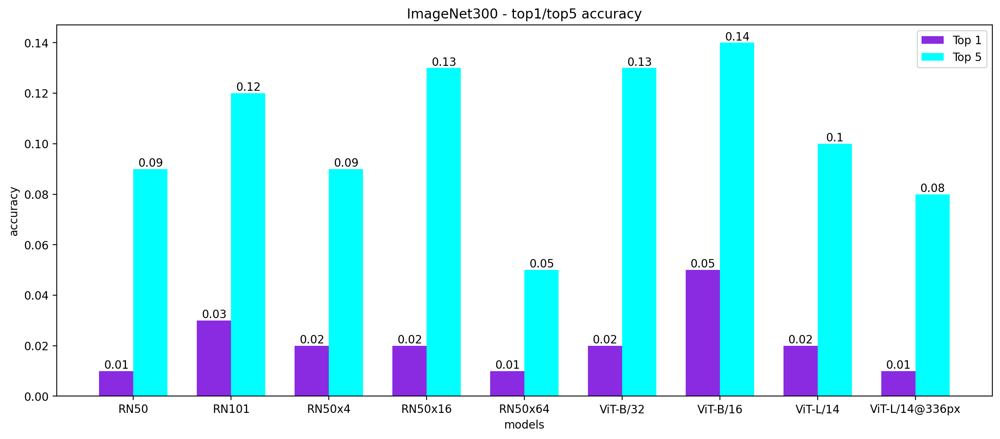

In [35]:
visualize2(res)